<a href="https://colab.research.google.com/github/Hemantha-krishna/ML-IDS-with-XAI/blob/main/ML_IDS_with_XAi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Load Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import statsmodels.api as sm
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree  import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn import svm
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.model_selection import GridSearchCV
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import RocCurveDisplay
!pip install shap
!pip install lime
import shap
import lime
from lime import lime_tabular


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=63087615445c989c8f9dfe0ab39aaca62a81849403aa2db4ed7fd3c7c829591b
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


# Load Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile

zip_ref = zipfile.ZipFile("/content/drive/MyDrive/Dataset/KDD.zip", 'r')
zip_ref.extractall("/content/dataset")
zip_ref.close()

In [ ]:
Trained_Data = pd.read_csv("/content/dataset/KDD/KDDTrain+.txt" , sep = "," , encoding = 'utf-8')
Tested_Data  = pd.read_csv("/content/dataset/KDD/KDDTest+.txt" , sep = "," , encoding = 'utf-8')

In [ ]:
Trained_Data

,0,tcp,ftp_data,SF,491,0.1,0.2,0.3,0.4,0.5,...,0.17,0.03,0.17.1,0.00.6,0.00.7,0.00.8,0.05,0.00.9,normal,20
0,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15
1,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19
2,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21
3,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,21
4,0,tcp,private,REJ,0,0,0,0,0,0,...,0.07,0.07,0.00,0.00,0.00,0.00,1.00,1.00,neptune,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125967,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.06,0.00,0.00,1.00,1.00,0.00,0.00,neptune,20
125968,8,udp,private,SF,105,145,0,0,0,0,...,0.96,0.01,0.01,0.00,0.00,0.00,0.00,0.00,normal,21
125969,0,tcp,smtp,SF,2231,384,0,0,0,0,...,0.12,0.06,0.00,0.00,0.72,0.00,0.01,0.00,normal,18
125970,0,tcp,klogin,S0,0,0,0,0,0,0,...,0.03,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,20


In [ ]:
Tested_Data

,0,tcp,private,REJ,0.1,0.2,0.3,0.4,0.5,0.6,...,0.04.1,0.06.1,0.00.3,0.00.4,0.00.5,0.00.6,1.00.2,1.00.3,neptune,21
0,0,tcp,private,REJ,0,0,0,0,0,0,...,0.00,0.06,0.00,0.00,0.00,0.0,1.00,1.00,neptune,21
1,2,tcp,ftp_data,SF,12983,0,0,0,0,0,...,0.61,0.04,0.61,0.02,0.00,0.0,0.00,0.00,normal,21
2,0,icmp,eco_i,SF,20,0,0,0,0,0,...,1.00,0.00,1.00,0.28,0.00,0.0,0.00,0.00,saint,15
3,1,tcp,telnet,RSTO,0,15,0,0,0,0,...,0.31,0.17,0.03,0.02,0.00,0.0,0.83,0.71,mscan,11
4,0,tcp,http,SF,267,14515,0,0,0,0,...,1.00,0.00,0.01,0.03,0.01,0.0,0.00,0.00,normal,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22538,0,tcp,smtp,SF,794,333,0,0,0,0,...,0.72,0.06,0.01,0.01,0.01,0.0,0.00,0.00,normal,21
22539,0,tcp,http,SF,317,938,0,0,0,0,...,1.00,0.00,0.01,0.01,0.01,0.0,0.00,0.00,normal,21
22540,0,tcp,http,SF,54540,8314,0,0,0,2,...,1.00,0.00,0.00,0.00,0.00,0.0,0.07,0.07,back,15
22541,0,udp,domain_u,SF,42,42,0,0,0,0,...,0.99,0.01,0.00,0.00,0.00,0.0,0.00,0.00,normal,21


# Columns Modification

In [ ]:
Columns = (['duration','protocol_type','service','flag','src_bytes','dst_bytes','land','wrong_fragment','urgent','hot',
            'num_failed_logins','logged_in','num_compromised','root_shell','su_attempted','num_root','num_file_creations',
            'num_shells','num_access_files','num_outbound_cmds','is_host_login','is_guest_login','count','srv_count',
            'serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate',
            'dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate',
            'dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate',
            'dst_host_srv_rerror_rate','attack','level'])

In [ ]:
Trained_Data.columns = Columns
Tested_Data.columns  = Columns

In [ ]:
Trained_Data.head(10)

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,level
0,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.0,0.00,normal,15
1,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.0,0.00,neptune,19
2,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.0,0.01,normal,21
3,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,normal,21
4,0,tcp,private,REJ,0,0,0,0,0,0,...,0.07,0.07,0.00,0.00,0.00,0.00,1.0,1.00,neptune,21
5,0,tcp,private,S0,0,0,0,0,0,0,...,0.04,0.05,0.00,0.00,1.00,1.00,0.0,0.00,neptune,21
6,0,tcp,private,S0,0,0,0,0,0,0,...,0.06,0.07,0.00,0.00,1.00,1.00,0.0,0.00,neptune,21
7,0,tcp,remote_job,S0,0,0,0,0,0,0,...,0.09,0.05,0.00,0.00,1.00,1.00,0.0,0.00,neptune,21
8,0,tcp,private,S0,0,0,0,0,0,0,...,0.05,0.06,0.00,0.00,1.00,1.00,0.0,0.00,neptune,21
9,0,tcp,private,REJ,0,0,0,0,0,0,...,0.05,0.07,0.00,0.00,0.00,0.00,1.0,1.00,neptune,21


In [ ]:
Tested_Data.head(10)

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,level
0,0,tcp,private,REJ,0,0,0,0,0,0,...,0.00,0.06,0.00,0.00,0.00,0.00,1.00,1.00,neptune,21
1,2,tcp,ftp_data,SF,12983,0,0,0,0,0,...,0.61,0.04,0.61,0.02,0.00,0.00,0.00,0.00,normal,21
2,0,icmp,eco_i,SF,20,0,0,0,0,0,...,1.00,0.00,1.00,0.28,0.00,0.00,0.00,0.00,saint,15
3,1,tcp,telnet,RSTO,0,15,0,0,0,0,...,0.31,0.17,0.03,0.02,0.00,0.00,0.83,0.71,mscan,11
4,0,tcp,http,SF,267,14515,0,0,0,0,...,1.00,0.00,0.01,0.03,0.01,0.00,0.00,0.00,normal,21
5,0,tcp,smtp,SF,1022,387,0,0,0,0,...,0.11,0.72,0.00,0.00,0.00,0.00,0.72,0.04,normal,21
6,0,tcp,telnet,SF,129,174,0,0,0,0,...,1.00,0.00,0.00,0.00,0.01,0.01,0.02,0.02,guess_passwd,15
7,0,tcp,http,SF,327,467,0,0,0,0,...,1.00,0.00,0.01,0.03,0.00,0.00,0.00,0.00,normal,21
8,0,tcp,ftp,SF,26,157,0,0,0,0,...,0.50,0.08,0.02,0.00,0.00,0.00,0.00,0.00,guess_passwd,7
9,0,tcp,telnet,SF,0,0,0,0,0,0,...,0.50,0.01,0.00,0.00,0.00,0.00,0.66,0.32,mscan,9


# Data Description

In [ ]:
Trained_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125972 entries, 0 to 125971
Data columns (total 43 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   duration                     125972 non-null  int64  
 1   protocol_type                125972 non-null  object 
 2   service                      125972 non-null  object 
 3   flag                         125972 non-null  object 
 4   src_bytes                    125972 non-null  int64  
 5   dst_bytes                    125972 non-null  int64  
 6   land                         125972 non-null  int64  
 7   wrong_fragment               125972 non-null  int64  
 8   urgent                       125972 non-null  int64  
 9   hot                          125972 non-null  int64  
 10  num_failed_logins            125972 non-null  int64  
 11  logged_in                    125972 non-null  int64  
 12  num_compromised              125972 non-null  int64  
 13 

In [ ]:
Tested_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22543 entries, 0 to 22542
Data columns (total 43 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   duration                     22543 non-null  int64  
 1   protocol_type                22543 non-null  object 
 2   service                      22543 non-null  object 
 3   flag                         22543 non-null  object 
 4   src_bytes                    22543 non-null  int64  
 5   dst_bytes                    22543 non-null  int64  
 6   land                         22543 non-null  int64  
 7   wrong_fragment               22543 non-null  int64  
 8   urgent                       22543 non-null  int64  
 9   hot                          22543 non-null  int64  
 10  num_failed_logins            22543 non-null  int64  
 11  logged_in                    22543 non-null  int64  
 12  num_compromised              22543 non-null  int64  
 13  root_shell      

In [ ]:
Trained_Data.describe()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,level
count,125972.000000,1.259720e+05,1.259720e+05,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000,...,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000,125972.000000
mean,287.146929,4.556710e+04,1.977927e+04,0.000198,0.022688,0.000111,0.204411,0.001222,0.395739,0.279253,...,115.653725,0.521244,0.082952,0.148379,0.032543,0.284455,0.278487,0.118832,0.120241,19.504056
std,2604.525522,5.870354e+06,4.021285e+06,0.014086,0.253531,0.014366,2.149977,0.045239,0.489011,23.942137,...,110.702886,0.448950,0.188922,0.308998,0.112564,0.444785,0.445670,0.306559,0.319460,2.291512
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,10.000000,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000
50%,0.000000,4.400000e+01,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,63.000000,0.510000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000
75%,0.000000,2.760000e+02,5.160000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,255.000000,1.000000,0.070000,0.060000,0.020000,1.000000,1.000000,0.000000,0.000000,21.000000
max,42908.000000,1.379964e+09,1.309937e+09,1.000000,3.000000,3.000000,77.000000,5.000000,1.000000,7479.000000,...,255.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,21.000000


In [ ]:
Tested_Data.describe()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,level
count,22543.000000,2.254300e+04,2.254300e+04,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,...,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000,22543.000000
mean,218.868784,1.039591e+04,2.056110e+03,0.000311,0.008428,0.000710,0.105399,0.021648,0.442222,0.119904,...,140.756332,0.608747,0.090541,0.132267,0.019639,0.097818,0.099430,0.233351,0.226649,18.017833
std,1407.207069,4.727969e+05,2.121976e+04,0.017619,0.142602,0.036474,0.928448,0.150331,0.496661,7.269758,...,111.783059,0.435681,0.220722,0.306274,0.085396,0.273144,0.281872,0.387204,0.400851,4.270409
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,15.000000,0.070000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.000000
50%,0.000000,5.400000e+01,4.600000e+01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,168.000000,0.920000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000
75%,0.000000,2.870000e+02,6.010000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,255.000000,1.000000,0.060000,0.030000,0.010000,0.000000,0.000000,0.360000,0.170000,21.000000
max,57715.000000,6.282565e+07,1.345927e+06,1.000000,3.000000,3.000000,101.000000,4.000000,1.000000,796.000000,...,255.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,21.000000


In [ ]:
Trained_Data.nunique()

duration                       2981
protocol_type                     3
service                          70
flag                             11
src_bytes                      3341
dst_bytes                      9326
land                              2
wrong_fragment                    3
urgent                            4
hot                              28
num_failed_logins                 6
logged_in                         2
num_compromised                  88
root_shell                        2
su_attempted                      3
num_root                         82
num_file_creations               35
num_shells                        3
num_access_files                 10
num_outbound_cmds                 1
is_host_login                     2
is_guest_login                    2
count                           512
srv_count                       509
serror_rate                      89
srv_serror_rate                  86
rerror_rate                      82
srv_rerror_rate             

In [ ]:
Tested_Data.nunique()

duration                        624
protocol_type                     3
service                          64
flag                             11
src_bytes                      1149
dst_bytes                      3650
land                              2
wrong_fragment                    3
urgent                            4
hot                              16
num_failed_logins                 5
logged_in                         2
num_compromised                  23
root_shell                        2
su_attempted                      3
num_root                         20
num_file_creations                9
num_shells                        4
num_access_files                  5
num_outbound_cmds                 1
is_host_login                     2
is_guest_login                    2
count                           495
srv_count                       457
serror_rate                      88
srv_serror_rate                  82
rerror_rate                      90
srv_rerror_rate             

In [ ]:
Trained_Data.max()

duration                             42908
protocol_type                          udp
service                              whois
flag                                    SH
src_bytes                       1379963888
dst_bytes                       1309937401
land                                     1
wrong_fragment                           3
urgent                                   3
hot                                     77
num_failed_logins                        5
logged_in                                1
num_compromised                       7479
root_shell                               1
su_attempted                             2
num_root                              7468
num_file_creations                      43
num_shells                               2
num_access_files                         9
num_outbound_cmds                        0
is_host_login                            1
is_guest_login                           1
count                                  511
srv_count  

In [ ]:
Tested_Data.max()

duration                          57715
protocol_type                       udp
service                           whois
flag                                 SH
src_bytes                      62825648
dst_bytes                       1345927
land                                  1
wrong_fragment                        3
urgent                                3
hot                                 101
num_failed_logins                     4
logged_in                             1
num_compromised                     796
root_shell                            1
su_attempted                          2
num_root                            878
num_file_creations                  100
num_shells                            5
num_access_files                      4
num_outbound_cmds                     0
is_host_login                         1
is_guest_login                        1
count                               511
srv_count                           511
serror_rate                         1.0


In [ ]:
Results = set(Trained_Data['attack'].values)
print(Results,end=" ")

{'imap', 'normal', 'land', 'back', 'guess_passwd', 'neptune', 'warezclient', 'rootkit', 'buffer_overflow', 'pod', 'multihop', 'smurf', 'phf', 'warezmaster', 'spy', 'teardrop', 'loadmodule', 'ipsweep', 'ftp_write', 'satan', 'perl', 'nmap', 'portsweep'} 

# Classifying The Attack Results

In [ ]:
Trained_attack = Trained_Data.attack.map(lambda a: 0 if a == 'normal' else 1)
Tested_attack = Tested_Data.attack.map(lambda a: 0 if a == 'normal' else 1)

Trained_Data['attack_state'] = Trained_attack
Tested_Data['attack_state'] = Tested_attack

In [ ]:
Trained_Data.head(10) # 'attack_state' column is added

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,level,attack_state
0,0,udp,other,SF,146,0,0,0,0,0,...,0.60,0.88,0.00,0.00,0.00,0.0,0.00,normal,15,0
1,0,tcp,private,S0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.00,1.00,0.0,0.00,neptune,19,1
2,0,tcp,http,SF,232,8153,0,0,0,0,...,0.00,0.03,0.04,0.03,0.01,0.0,0.01,normal,21,0
3,0,tcp,http,SF,199,420,0,0,0,0,...,0.00,0.00,0.00,0.00,0.00,0.0,0.00,normal,21,0
4,0,tcp,private,REJ,0,0,0,0,0,0,...,0.07,0.00,0.00,0.00,0.00,1.0,1.00,neptune,21,1
5,0,tcp,private,S0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.00,1.00,0.0,0.00,neptune,21,1
6,0,tcp,private,S0,0,0,0,0,0,0,...,0.07,0.00,0.00,1.00,1.00,0.0,0.00,neptune,21,1
7,0,tcp,remote_job,S0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.00,1.00,0.0,0.00,neptune,21,1
8,0,tcp,private,S0,0,0,0,0,0,0,...,0.06,0.00,0.00,1.00,1.00,0.0,0.00,neptune,21,1
9,0,tcp,private,REJ,0,0,0,0,0,0,...,0.07,0.00,0.00,0.00,0.00,1.0,1.00,neptune,21,1


In [ ]:
Tested_Data.head(10) # 'attack_state' column is added

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,level,attack_state
0,0,tcp,private,REJ,0,0,0,0,0,0,...,0.06,0.00,0.00,0.00,0.00,1.00,1.00,neptune,21,1
1,2,tcp,ftp_data,SF,12983,0,0,0,0,0,...,0.04,0.61,0.02,0.00,0.00,0.00,0.00,normal,21,0
2,0,icmp,eco_i,SF,20,0,0,0,0,0,...,0.00,1.00,0.28,0.00,0.00,0.00,0.00,saint,15,1
3,1,tcp,telnet,RSTO,0,15,0,0,0,0,...,0.17,0.03,0.02,0.00,0.00,0.83,0.71,mscan,11,1
4,0,tcp,http,SF,267,14515,0,0,0,0,...,0.00,0.01,0.03,0.01,0.00,0.00,0.00,normal,21,0
5,0,tcp,smtp,SF,1022,387,0,0,0,0,...,0.72,0.00,0.00,0.00,0.00,0.72,0.04,normal,21,0
6,0,tcp,telnet,SF,129,174,0,0,0,0,...,0.00,0.00,0.00,0.01,0.01,0.02,0.02,guess_passwd,15,1
7,0,tcp,http,SF,327,467,0,0,0,0,...,0.00,0.01,0.03,0.00,0.00,0.00,0.00,normal,21,0
8,0,tcp,ftp,SF,26,157,0,0,0,0,...,0.08,0.02,0.00,0.00,0.00,0.00,0.00,guess_passwd,7,1
9,0,tcp,telnet,SF,0,0,0,0,0,0,...,0.01,0.00,0.00,0.00,0.00,0.66,0.32,mscan,9,1


# Check Data for any missing values

In [ ]:
Trained_Data.isnull().sum()

duration                       0
protocol_type                  0
service                        0
flag                           0
src_bytes                      0
dst_bytes                      0
land                           0
wrong_fragment                 0
urgent                         0
hot                            0
num_failed_logins              0
logged_in                      0
num_compromised                0
root_shell                     0
su_attempted                   0
num_root                       0
num_file_creations             0
num_shells                     0
num_access_files               0
num_outbound_cmds              0
is_host_login                  0
is_guest_login                 0
count                          0
srv_count                      0
serror_rate                    0
srv_serror_rate                0
rerror_rate                    0
srv_rerror_rate                0
same_srv_rate                  0
diff_srv_rate                  0
srv_diff_h

In [ ]:
Tested_Data.isnull().sum()

duration                       0
protocol_type                  0
service                        0
flag                           0
src_bytes                      0
dst_bytes                      0
land                           0
wrong_fragment                 0
urgent                         0
hot                            0
num_failed_logins              0
logged_in                      0
num_compromised                0
root_shell                     0
su_attempted                   0
num_root                       0
num_file_creations             0
num_shells                     0
num_access_files               0
num_outbound_cmds              0
is_host_login                  0
is_guest_login                 0
count                          0
srv_count                      0
serror_rate                    0
srv_serror_rate                0
rerror_rate                    0
srv_rerror_rate                0
same_srv_rate                  0
diff_srv_rate                  0
srv_diff_h

No missing data

# Check for duplicates

In [ ]:
Trained_Data.duplicated().sum()

0

In [ ]:
Tested_Data.duplicated().sum()

0

No duplicate data


# Handling Outliers

In [ ]:
Trained_Data.shape

(125972, 44)

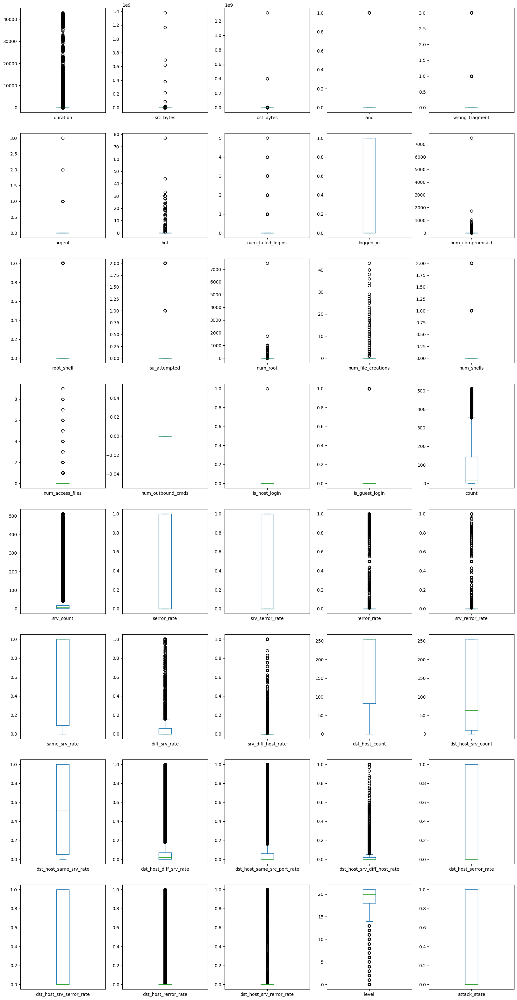

In [ ]:
Trained_Data.plot(kind='box', subplots=True, layout=(8, 5), figsize=(20, 40))
plt.show()

In [ ]:
Tested_Data.shape

(22543, 44)

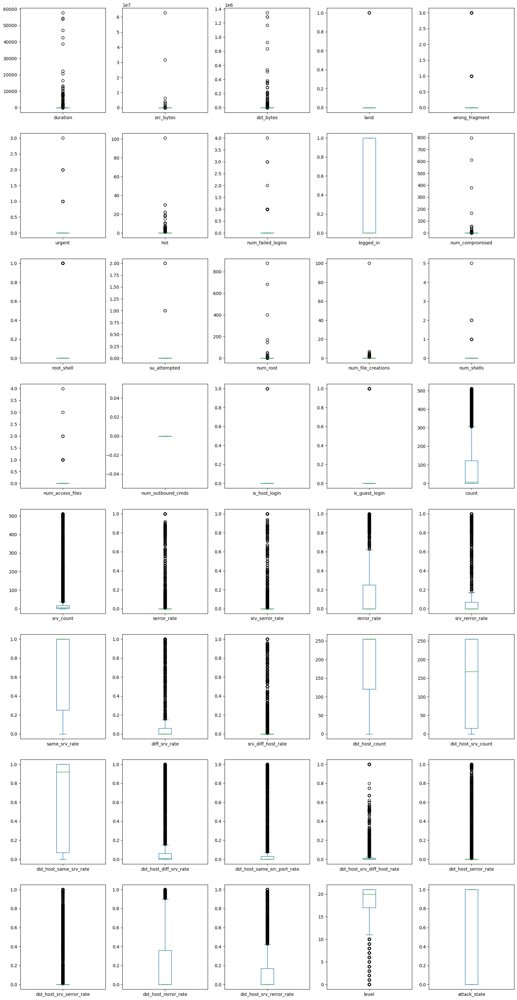

In [ ]:
Tested_Data.plot(kind='box',subplots=True,layout=(8,5),figsize=(20,40))
plt.show()

No significant outliers in the data

# Data Encoding

In [ ]:
Trained_Data = pd.get_dummies(Trained_Data,columns=['protocol_type','service','flag'],prefix="",prefix_sep="")

In [ ]:
Tested_Data = pd.get_dummies(Tested_Data,columns=['protocol_type','service','flag'],prefix="",prefix_sep="")

In [ ]:
LE = LabelEncoder()
attack_LE= LabelEncoder()
Trained_Data['attack'] = attack_LE.fit_transform(Trained_Data["attack"])
Tested_Data['attack'] = attack_LE.fit_transform(Tested_Data["attack"])

# Data Splitting

In [ ]:
X_train = Trained_Data.drop('attack', axis = 1)
X_train = Trained_Data.drop('level', axis = 1)
X_train = Trained_Data.drop('attack_state', axis = 1)

X_test = Tested_Data.drop('attack', axis = 1)
X_test = Tested_Data.drop('level', axis = 1)
X_test = Tested_Data.drop('attack_state', axis = 1)

Y_train = Trained_Data['attack_state']
Y_test = Tested_Data['attack_state']

In [ ]:
# Splitting the data into training, testing, and validation sets
X_train_train,X_test_train ,Y_train_train,Y_test_train = train_test_split(X_train, Y_train, test_size= 0.25 , random_state=42)
X_train_test,X_test_test,Y_train_test,Y_test_test = train_test_split(X_test, Y_test, test_size= 0.25 , random_state=42)


75% of the original data : **Training set** <br>
25% of the original data:  **Evalutation set**

Evaluation set is Split further into:<br>
**Testing set**  (75% of the evaluation set)<br>
**Validation set** (25% of the evaluation set)


# Data Scaling

In [ ]:
# Store the feature names before scaling
feature_names = Trained_Data.drop(['attack', 'level', 'attack_state'], axis=1).columns.tolist()
'''Ro_scaler = RobustScaler()

X_train_train = Ro_scaler.fit_transform(X_train_train)
X_test_train= Ro_scaler.transform(X_test_train)
X_train_test = Ro_scaler.fit_transform(X_train_test)
X_test_test= Ro_scaler.transform(X_test_test)'''

from sklearn.preprocessing import StandardScaler

# Instantiate StandardScaler
scaler = StandardScaler()

X_train_train = scaler.fit_transform(X_train_train)
X_test_train= scaler.transform(X_test_train)
X_train_test = scaler.fit_transform(X_train_test)
X_test_test= scaler.transform(X_test_test)

In [ ]:
X_train_train.shape, Y_train_train.shape

((94479, 124), (94479,))

In [ ]:
X_test_train.shape, Y_test_train.shape

((31493, 124), (31493,))

In [ ]:
X_train_test.shape, Y_train_test.shape

((16907, 118), (16907,))

In [ ]:
X_test_test.shape, Y_test_test.shape

((5636, 118), (5636,))

# Data Modelling

In [ ]:
def Evaluate(Model_Name, Model_Abb, X_train, Y_train, X_test, Y_test):
    # Predictions and evaluation metrics for training data
    train_Pred_Value = Model_Abb.predict(X_train)
    train_Accuracy = metrics.accuracy_score(Y_train, train_Pred_Value)
    train_Sensitivity = metrics.recall_score(Y_train, train_Pred_Value)
    train_Precision = metrics.precision_score(Y_train, train_Pred_Value)
    train_F1_score = metrics.f1_score(Y_train, train_Pred_Value)
    train_Recall = metrics.recall_score(Y_train, train_Pred_Value)

    # Predictions and evaluation metrics for testing data
    test_Pred_Value = Model_Abb.predict(X_test)
    test_Accuracy = metrics.accuracy_score(Y_test, test_Pred_Value)
    test_Sensitivity = metrics.recall_score(Y_test, test_Pred_Value)
    test_Precision = metrics.precision_score(Y_test, test_Pred_Value)
    test_F1_score = metrics.f1_score(Y_test, test_Pred_Value)
    test_Recall = metrics.recall_score(Y_test, test_Pred_Value)

    print('--------------------------------------------------\n')
    print('Training Results for {} Model:'.format(Model_Name))
    print('Training Accuracy   = {}'.format(np.round(train_Accuracy, 3)))
    print('Training Sensitivity = {}'.format(np.round(train_Sensitivity, 3)))
    print('Training Precision  = {}'.format(np.round(train_Precision, 3)))
    print('Training F1 Score   = {}'.format(np.round(train_F1_score, 3)))
    print('Training Recall     = {}'.format(np.round(train_Recall, 3)))
    print('--------------------------------------------------\n')

    print('Testing Results for {} Model:'.format(Model_Name))
    print('Testing Accuracy   = {}'.format(np.round(test_Accuracy, 3)))
    print('Testing Sensitivity = {}'.format(np.round(test_Sensitivity, 3)))
    print('Testing Precision  = {}'.format(np.round(test_Precision, 3)))
    print('Testing F1 Score   = {}'.format(np.round(test_F1_score, 3)))
    print('Testing Recall     = {}'.format(np.round(test_Recall, 3)))
    print('--------------------------------------------------\n')

    # Confusion matrix and ROC curve for testing data
    Confusion_Matrix = metrics.confusion_matrix(Y_test, test_Pred_Value)
    plot_confusion_matrix(Confusion_Matrix, class_names=['Normal', 'Attack'], figsize=(5.55, 5), colorbar="blue")
    RocCurveDisplay.from_estimator(Model_Abb, X_test, Y_test)

    # SHAP Explanations
    #explainer = shap.Explainer(Model_Abb.predict, X_test)
    #explainer = shap.Explainer(Model_Abb.predict, X_test, shap.approximators.gaussian)

    '''explainer = shap.Explainer(Model_Abb.predict, X_test,nsamples=100, nthreads=4)

    shap_values = explainer.shap_values(X_test)
    shap.summary_plot(shap_values, X_test, show=False)
    plt.title(f"{Model_Name} SHAP Summary Plot")
    plt.show()'''



# LIME Explanations

    num_features = X_train_train.shape[1]
    explainer_lime = lime_tabular.LimeTabularExplainer(X_train_train, mode="classification", feature_names=Trained_Data.columns.tolist(), class_names=['Normal', 'Attack'])
    instance_idx = 5
    instance = X_test_train[instance_idx]
    explanation = explainer_lime.explain_instance(instance, Model_Abb.predict_proba, num_features=num_features, top_labels=1)
    explanation.show_in_notebook(show_table=True, show_all=False)
    explanation.save_to_file(f'{Model_Name}_lime_explanation.html')




In [ ]:
def GridSearch(Model_Abb, Parameters, X_train, Y_train):
    Grid = GridSearchCV(estimator=Model_Abb, param_grid= Parameters, cv = 3, n_jobs=-1)
    Grid_Result = Grid.fit(X_train, Y_train)
    Model_Name = Grid_Result.best_estimator_

    return (Model_Name)

Speed of execution order from fastest to slowest:

Logistic Regression <br>
Decision Tree<br>
KNN (K-Nearest Neighbors)<br>
SVM (Support Vector Machine)<br>
Random Forest<br>

# Decision tree classifier

In [ ]:
DT =DecisionTreeClassifier(max_features=6, max_depth=4)
DT.fit(X_train_train, Y_train_train)

DecisionTreeClassifier(max_depth=4, max_features=6)

In [ ]:
DT.score(X_train_train, Y_train_train), DT.score(X_test_train, Y_test_train)

(0.9279310746303411, 0.9261105642523736)

In [ ]:
#param_grid = {'max_depth': [2, 4, 6, 8, 10], 'min_samples_split': [2, 5, 10]}
#dt = DecisionTreeClassifier()
#dt_best = GridSearch(dt, param_grid, X_train_train, Y_train_train)

--------------------------------------------------

Training Results for Decision Tree Classifier Model:
Training Accuracy   = 0.928
Training Sensitivity = 0.879
Training Precision  = 0.963
Training F1 Score   = 0.919
Training Recall     = 0.879
--------------------------------------------------

Testing Results for Decision Tree Classifier Model:
Testing Accuracy   = 0.926
Testing Sensitivity = 0.88
Testing Precision  = 0.959
Testing F1 Score   = 0.918
Testing Recall     = 0.88
--------------------------------------------------



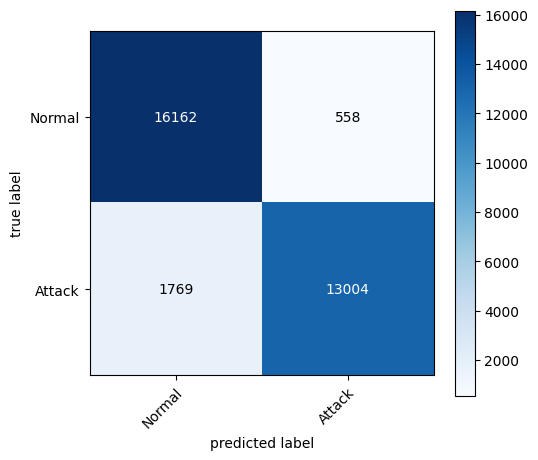

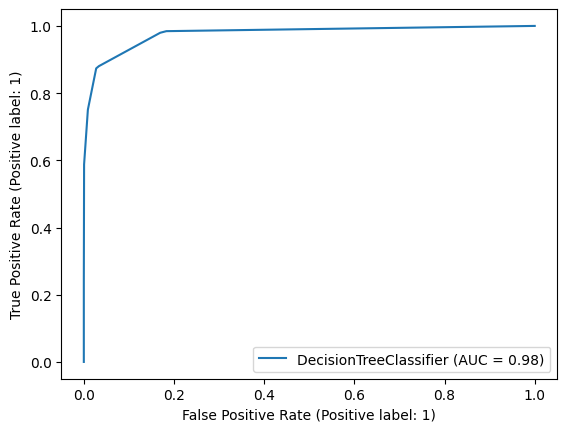

In [ ]:
#dt_best.fit(X_train_train, Y_train_train)
Evaluate('Decision Tree Classifier', DT, X_train_train, Y_train_train, X_test_train, Y_test_train)

[Text(0.6041666666666666, 0.9, 'x[118] <= 0.501\ngini = 0.497\nsamples = 94479\nvalue = [50622, 43857]'),
 Text(0.3333333333333333, 0.7, 'x[2] <= -0.005\ngini = 0.388\nsamples = 68389\nvalue = [50353, 18036]'),
 Text(0.16666666666666666, 0.5, 'x[25] <= -1.062\ngini = 0.435\nsamples = 24719\nvalue = [7892, 16827]'),
 Text(0.08333333333333333, 0.3, 'x[45] <= 5.938\ngini = 0.09\nsamples = 7534\nvalue = [355, 7179]'),
 Text(0.041666666666666664, 0.1, 'gini = 0.091\nsamples = 7398\nvalue = [355, 7043]'),
 Text(0.125, 0.1, 'gini = 0.0\nsamples = 136\nvalue = [0, 136]'),
 Text(0.25, 0.3, 'x[40] <= 1.766\ngini = 0.492\nsamples = 17185\nvalue = [7537, 9648]'),
 Text(0.20833333333333334, 0.1, 'gini = 0.479\nsamples = 11200\nvalue = [6741, 4459]'),
 Text(0.2916666666666667, 0.1, 'gini = 0.231\nsamples = 5985\nvalue = [796, 5189]'),
 Text(0.5, 0.5, 'x[24] <= 0.12\ngini = 0.054\nsamples = 43670\nvalue = [42461, 1209]'),
 Text(0.4166666666666667, 0.3, 'x[18] <= 5.079\ngini = 0.039\nsamples = 43029\n

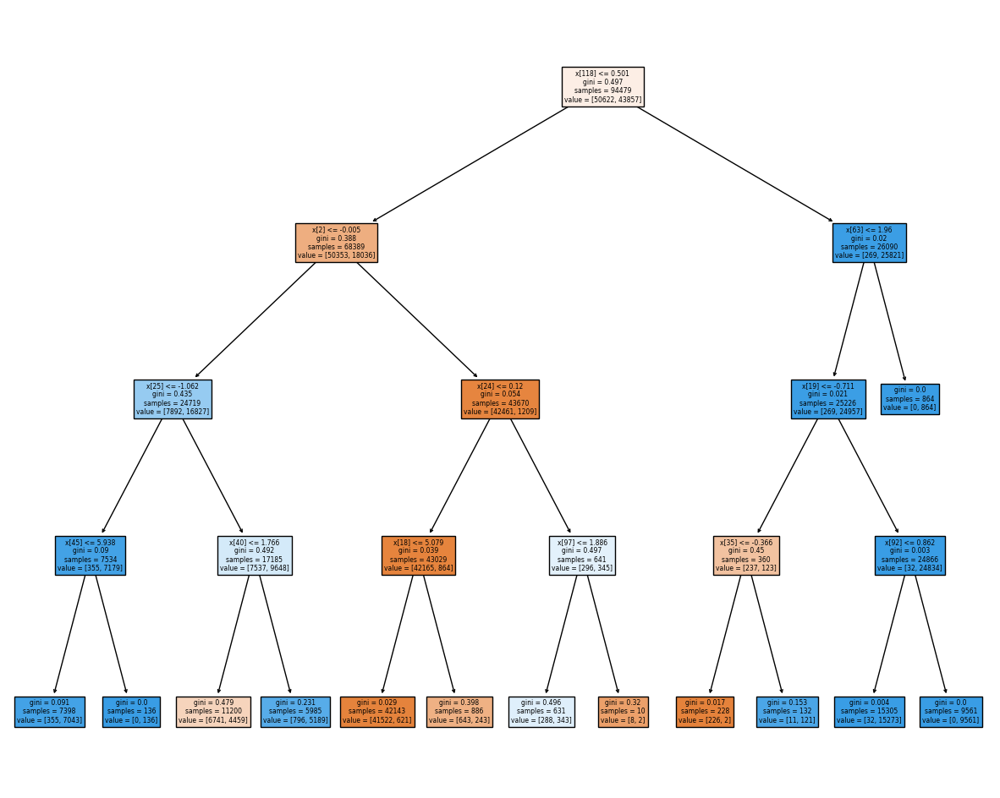

In [ ]:
fig = plt.figure(figsize=(15,12))
tree.plot_tree(DT, filled=True)
#tree.plot_tree(dt_best, filled=True)

# SVM Classifier

In [ ]:
Linear_SVC = svm.LinearSVC(C=1)
Linear_SVC.fit(X_train_train, Y_train_train)

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


LinearSVC(C=1)

In [ ]:
Linear_SVC.score(X_train_train, Y_train_train), Linear_SVC.score(X_test_train, Y_test_train)

(0.9898495962065644, 0.9892039500841456)

--------------------------------------------------

Training Results for SVM Linear SVC Kernel Model:
Training Accuracy   = 0.99
Training Sensitivity = 0.992
Training Precision  = 0.986
Training F1 Score   = 0.989
Training Recall     = 0.992
--------------------------------------------------

Testing Results for SVM Linear SVC Kernel Model:
Testing Accuracy   = 0.989
Testing Sensitivity = 0.992
Testing Precision  = 0.985
Testing F1 Score   = 0.989
Testing Recall     = 0.992
--------------------------------------------------



AttributeError: 'LinearSVC' object has no attribute 'predict_proba'

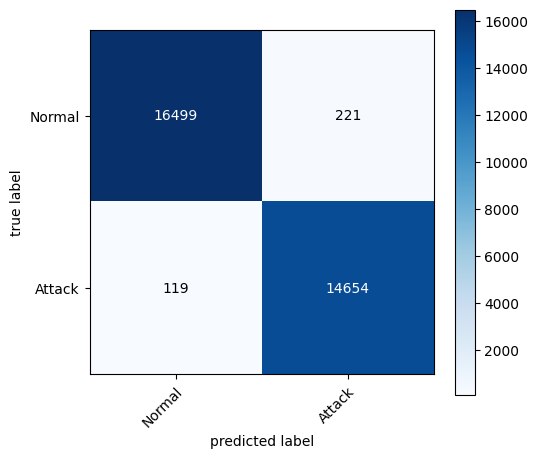

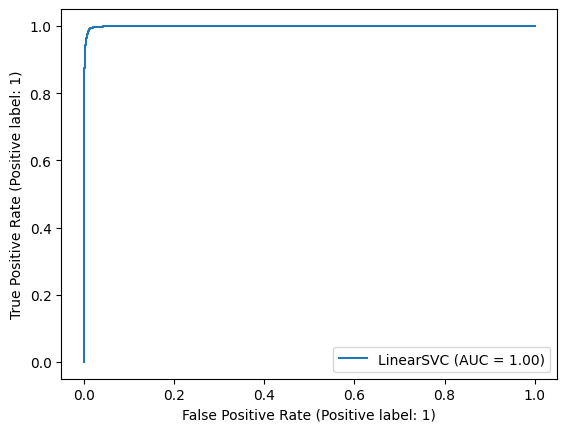

In [ ]:
Evaluate('SVM Linear SVC Kernel', Linear_SVC, X_train_train, Y_train_train, X_test_train, Y_test_train)

# KNN Model

In [ ]:
#KNN= KNeighborsClassifier(n_neighbors=6)
#KNN.fit(X_train_train, Y_train_train)

In [ ]:
param_grid = {'n_neighbors': [3, 5, 7, 9, 11]}
KNN = KNeighborsClassifier()
KNN_best = GridSearch(KNN, param_grid, X_train_train, Y_train_train)

In [ ]:
KNN_best.score(X_train_train, Y_train_train), KNN_best.score(X_test_train, Y_test_train)

(0.9996507160321342, 0.9991109135363414)

--------------------------------------------------

Training Results for KNN Model:
Training Accuracy   = 1.0
Training Sensitivity = 0.999
Training Precision  = 1.0
Training F1 Score   = 1.0
Training Recall     = 0.999
--------------------------------------------------

Testing Results for KNN Model:
Testing Accuracy   = 0.999
Testing Sensitivity = 0.999
Testing Precision  = 0.999
Testing F1 Score   = 0.999
Testing Recall     = 0.999
--------------------------------------------------



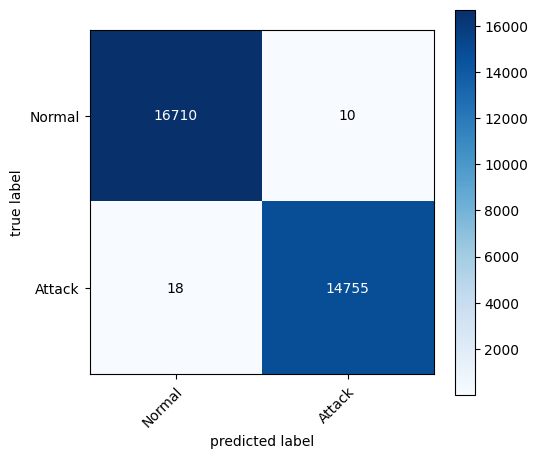

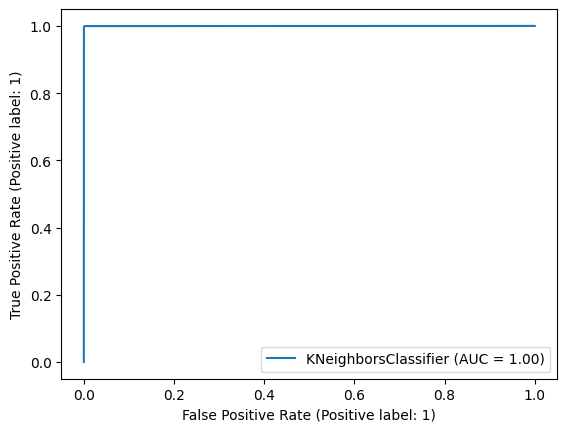

In [ ]:
KNN_best.fit(X_train_train, Y_train_train)
Evaluate('KNN', KNN_best, X_train_train, Y_train_train, X_test_train, Y_test_train)

# Random Forest

In [ ]:
max_depth= [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
Parameters={ 'max_depth': max_depth}

In [ ]:
RF= RandomForestClassifier()
GridSearch(RF, Parameters, X_train_train, Y_train_train)

RandomForestClassifier(max_depth=10)

In [ ]:
RF.fit(X_train_train, Y_train_train)

RandomForestClassifier()

In [ ]:
RF.score(X_train_train, Y_train_train), RF.score(X_test_train, Y_test_train)

(1.0, 1.0)

In [ ]:
'''max_depth = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
param_grid = {'max_depth': max_depth}
rf = RandomForestClassifier()
rf_best = GridSearch(rf, param_grid, X_train_train, Y_train_train)'''

--------------------------------------------------

Training Results for Random Forest Model:
Training Accuracy   = 1.0
Training Sensitivity = 1.0
Training Precision  = 1.0
Training F1 Score   = 1.0
Training Recall     = 1.0
--------------------------------------------------

Testing Results for Random Forest Model:
Testing Accuracy   = 1.0
Testing Sensitivity = 1.0
Testing Precision  = 1.0
Testing F1 Score   = 1.0
Testing Recall     = 1.0
--------------------------------------------------



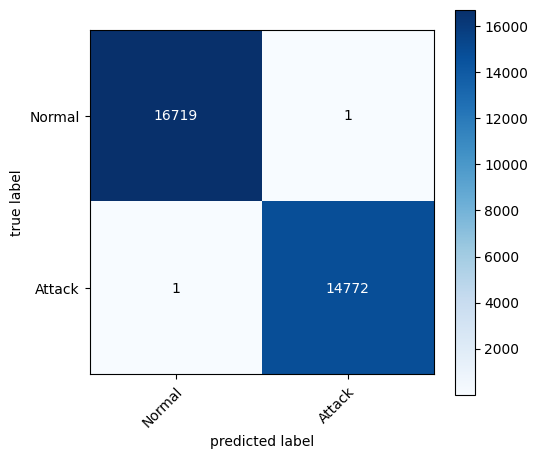

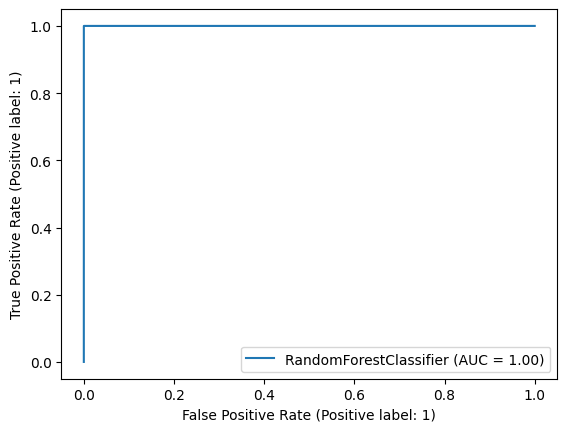

In [ ]:
'''rf_best.fit(X_train_train, Y_train_train)
Evaluate('Random Forest', rf_best, X_train_train, Y_train_train, X_test_train, Y_test_train)'''

--------------------------------------------------

Training Results for Random Forest Classifier Model:
Training Accuracy   = 1.0
Training Sensitivity = 1.0
Training Precision  = 1.0
Training F1 Score   = 1.0
Training Recall     = 1.0
--------------------------------------------------

Testing Results for Random Forest Classifier Model:
Testing Accuracy   = 1.0
Testing Sensitivity = 1.0
Testing Precision  = 1.0
Testing F1 Score   = 1.0
Testing Recall     = 1.0
--------------------------------------------------



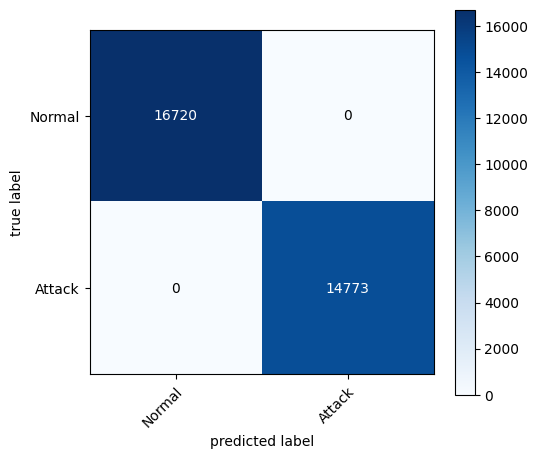

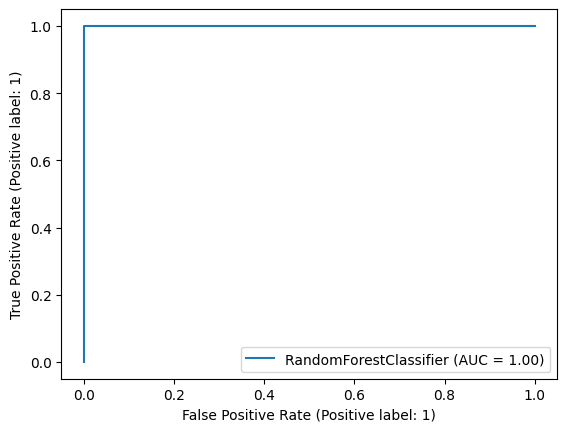

In [ ]:
Evaluate('Random Forest Classifier', RF, X_train_train, Y_train_train, X_test_train, Y_test_train)

# LOGISTIC REGRESSION

In [ ]:
# Define hyperparameters for logistic regression
penalty = ['l1', 'l2']
C = [0.001, 0.01, 0.1, 1, 10, 100, 1000]
solver = ['liblinear', 'saga']

# Create a dictionary of hyperparameters
parameters = {'penalty': penalty,
              'C': C,
              'solver': solver}

In [ ]:
# Perform grid search to find the best hyperparameters
LR_grid = GridSearchCV(estimator=LogisticRegression(), param_grid=parameters, cv=3, n_jobs=-1)
LR_grid.fit(X_train_train, Y_train_train)

# Get the best hyperparameters
best_LR = LR_grid.best_estimator_

Best Hyperparameters for Logistic Regression: {'C': 1000, 'penalty': 'l2', 'solver': 'liblinear'}
--------------------------------------------------

Training Results for Logistic Regression with Hyperparameters Model:
Training Accuracy   = 0.991
Training Sensitivity = 0.993
Training Precision  = 0.987
Training F1 Score   = 0.99
Training Recall     = 0.993
--------------------------------------------------

Testing Results for Logistic Regression with Hyperparameters Model:
Testing Accuracy   = 0.99
Testing Sensitivity = 0.992
Testing Precision  = 0.986
Testing F1 Score   = 0.989
Testing Recall     = 0.992
--------------------------------------------------



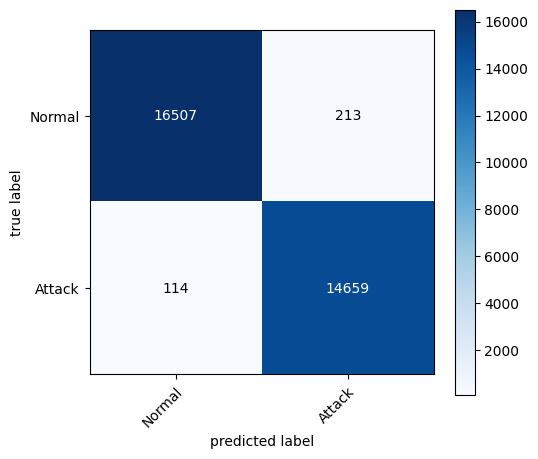

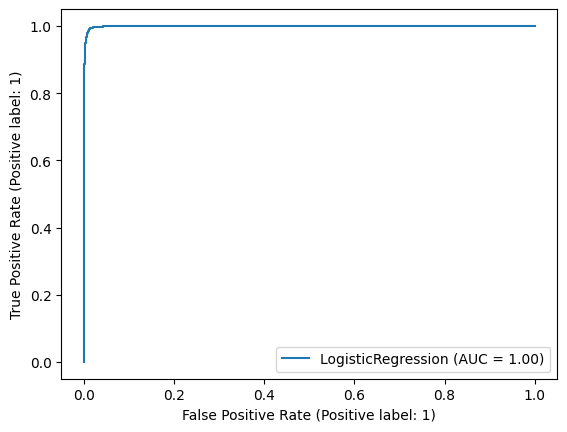

In [ ]:
# Print the best hyperparameters
print("Best Hyperparameters for Logistic Regression:", LR_grid.best_params_)

# Evaluate the model with the best hyperparameters
#Evaluate('Logistic Regression with Hyperparameters', best_LR, X_test_train, Y_test_train)


# Evaluate Logistic Regression with best hyperparameters
Evaluate('Logistic Regression with Hyperparameters', best_LR, X_train_train, Y_train_train, X_test_train, Y_test_train)


# END